<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Cody Kesler
    321
    11/28/2018

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
import IPython
from scipy import fftpack
from scipy import signal
from time import time

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [54]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples
        self.dft = fftpack.fft(samples).real
        self.n = len(samples)
        self.filename = ''

    # Problems 1.1 and 1.7
    def plot(self, dft=False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        n = len(self.samples)
        wav_len = n / self.rate
        time_x = np.linspace(0, n, n) / self.rate
        
        if(dft):
            ax1 = plt.subplot(121)
            ax2 = plt.subplot(122)
            
            ax1.plot(time_x, self.samples)
            ax1.set_ylim([-32768,32767])
            ax1.set_xlabel("Time (Seconds)")
            ax1.set_ylabel("Samples")
            ax1.set_title("Sound Waves")
            
            freq = [(k*self.rate)/n for k in range(n)]
            ax2.plot(freq, np.abs(self.dft))
            ax2.set_xlabel("Frequency (Htz)")
            ax2.set_ylabel("Magnitude")
            ax2.set_xlim([0, self.rate/2])
            ax2.set_title("Visualizing DFT")
            
            plt.suptitle("Subplotted")
            plt.show()
            
        else:
            time_x = np.linspace(0, n, n) / self.rate
            plt.plot(time_x, self.samples)
            plt.ylim([-32768,32767])
            plt.title("Sounds Waves")
            plt.xlabel("Time (Seconds)")
            plt.ylabel("Samples")
            plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        samples = self.samples.real
        if(samples.dtype != np.int16 or force == True):
            samples = np.int16((samples * 32767.)/np.abs(samples).max())
            wavfile.write(filename, self.rate, samples)
        else:
            wavfile.write(filename, self.rate, samples)
            
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if(len(self.samples) != len(other.samples)):
            raise ValueError("The samples of the two objects must be the same length.")
        else:
            return SoundWave(self.rate, self.samples+other.samples)
            
    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if(self.rate != other.rate):
            raise ValueError("The rate of the sound in both objects must be the same.")
        else:
            return SoundWave(self.rate, np.append(self.samples, other.samples))
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        samples = np.copy(self.samples)
        osamples = np.copy(other.samples)
        diff1 = len(self.samples) - len(other.samples)
        diff2 = len(other.samples) - len(self.samples)
        if(self.rate != other.rate):
            raise ValueError("The sample rates must be the same")
        else:
            if(diff1 > 0):
                osamples = np.hstack((osamples,np.zeros(diff1))) 
            elif(diff2 > 0):
                samples = np.hstack((samples,np.zeros(diff2))) 
            s_dft = np.array(fftpack.fft(samples))
            os_dft = np.array(fftpack.fft(osamples))
            return SoundWave(self.rate, fftpack.ifft(np.array(s_dft) * np.array(os_dft)))
            
    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        
        if(len(self.samples) != len(other.samples)):
            raise ValueError("The samples of the two objects must be the same length.")
        else:
            samples = np.copy(self.samples)
            osamples = np.copy(other.samples)
            n = len(samples)
            m = len(osamples)
            
            a = 0
            while 2**a < (n + m - 1):
                a += 1
            
            num = 2**a
            diff1 = num - n
            diff2 = num - m
            
            samples = np.concatenate((samples,np.zeros(diff1))) 
            osamples = np.concatenate((osamples,np.zeros(diff2)))
            
            s_dft = fftpack.fft(samples)
            os_dft = fftpack.fft(osamples)
            
            return SoundWave(self.rate, fftpack.ifft(s_dft * os_dft).real[:n + m - 1])


    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        low_k = (low_freq*len(self.samples))//self.rate
        high_k = (high_freq*len(self.samples))//self.rate
        n = len(self.samples)
        for i in range(low_k, high_k+1):
            self.dft[i] = 0
            self.dft[n - i] = 0
        
        self.samples = fftpack.ifft(self.dft).real
        return


### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

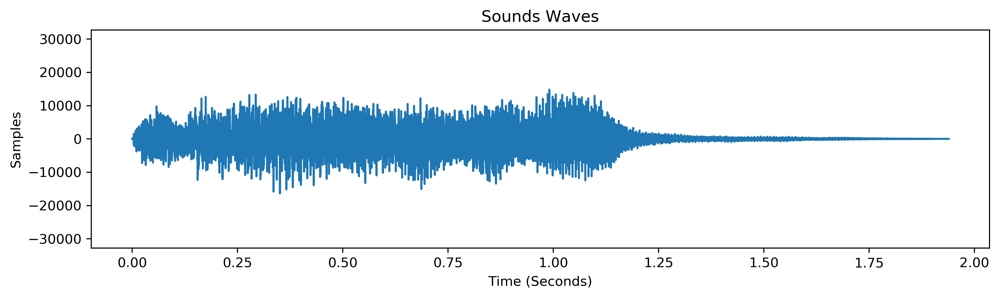

In [4]:
# Open file
rate, samples = wavfile.read('tada.wav')

# Create sound wave file and plot
sw = SoundWave(rate, samples)
sw.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [5]:
# listen to original sound
IPython.display.Audio('tada.wav')

In [6]:
# export and listen to class genrated file
sw.export('test1.wav')
IPython.display.Audio('test1.wav')

In [7]:
# export and listen to class genrated file
sw.export('test2.wav', force=True)
IPython.display.Audio('test2.wav')

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [8]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    rate = 44100
    
    # Get each sample number
    each_sample_number = np.arange(duration * rate)
    
    # Take samples from the sin(2pi function) for each of the sample numbers
    samples = np.sin(2 * np.pi * each_sample_number * frequency / rate)
    return SoundWave(rate, samples)

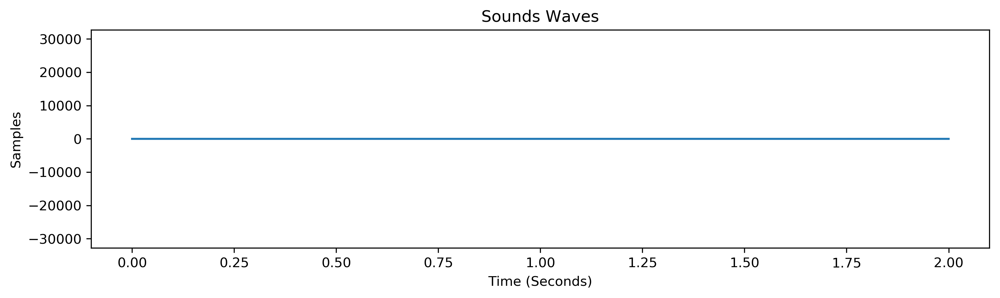

In [9]:
# Build a sound wave with the note A
sw_a = generate_note(440., 2)
sw_a.export('test3.wav')

# Plot and listen
sw_a.plot()
IPython.display.Audio('test3.wav')

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

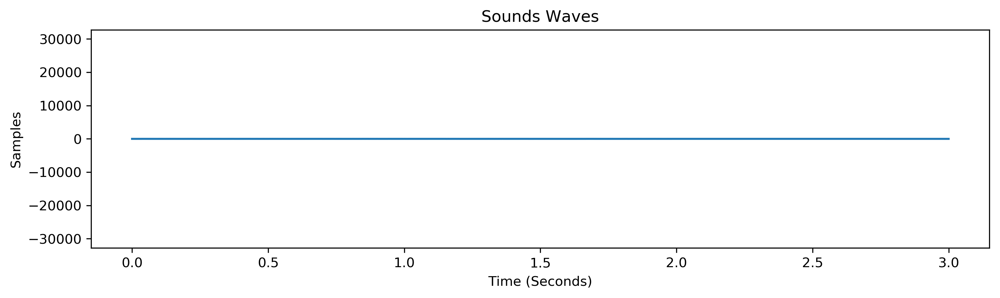

In [10]:
sw_A = generate_note(440., 3)
sw_C = generate_note(523.25, 3)
sw_E = generate_note(659.25, 3)

# Add the sound wave samples to eachother
sw_cord = sw_A + sw_C + sw_E
sw_cord.plot()
sw_cord.export('cord.wav')
IPython.display.Audio('cord.wav')

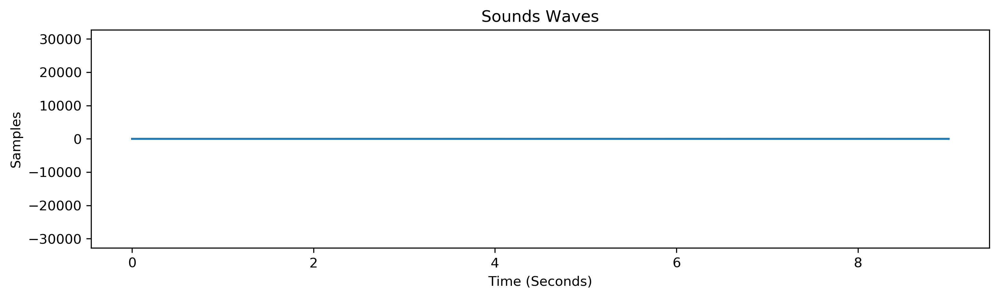

In [11]:
# Concat the C sound to the A sound
sw_ac = sw_A >> sw_C
# Concat theE sound to the E sound
sw_arp = sw_ac >> sw_E

# Export and listen
sw_arp.export('arp.wav')
sw_arp.plot()
IPython.display.Audio('arp.wav')

### Problem 1.5

- Implement `simple_dft()` with the formula for $c_k$ given below.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [12]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    z = np.arange(n)
    # Build a matrix of the rangeing exponent values
    A = np.outer(z,z)
    # Takes the exponent of the matrix entries divide by n and then multiply by the samples
    return (np.exp((-2*np.pi*1j*A)/n) / n)@samples


In [13]:
# Build random samples
samples = np.random.randint(0,10,(5))

# Use standard fft calc
std_dft = fftpack.fft(samples)

# Use custom dft calc
my_dft = simple_dft(samples)*len(samples)

# Compare to make sure its correct
print(np.allclose(std_dft, my_dft))
np.allclose(std_dft, my_dft)

True


True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [14]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    
    def split(samples):
        n = len(samples)
        if(n <= threshold):
            # Use the function from Problem 5 for small enough samples
            return n*simple_dft(samples)
        else:
            # Get the DFT of every other entry of samples, starting from 0
            even = split(samples[::2])
            # Get the DFT of every other entry of samples, starting from 1.
            odd = split(samples[1::2])
            
            #Calculatetheexponentialpartsofthesum.
            z = np.arange(n)
            z = np.exp((-2*np.pi*1j*z)/n)
            
            #Get the middle index for z
            m = n // 2
            lhs = even + z[:m]*odd
            rhs = even + z[m:]*odd
            
            # Concatenate two arrays of length m
            return np.hstack((lhs, rhs))
        
    return split(samples)/len(samples)
            

In [15]:
samples = np.random.randint(0,10,(8192))

# Calculte dft using the simple naive implementation
start = time()
my_dft = simple_dft(samples)*len(samples)
print("Custom normal fourier transform: ", str(time()-start))

# Calculte dft using the custom fast implementation
start = time()
my_fft = simple_fft(samples)*len(samples)
print("Custom fast fourier transform time(sec): ", str(time()-start))
# print(my_fft)

# Calculte dft using the standard fast implementation
start = time()
std_fft = fftpack.fft(samples)
print("Standard fast fourier transform time(sec): ", str(time()-start))
# print(std_fft)

np.allclose(std_fft, my_fft)

Custom normal fourier transform:  5.268673896789551
Custom fast fourier transform time(sec):  0.36760592460632324
Standard fast fourier transform time(sec):  0.0005502700805664062


True

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

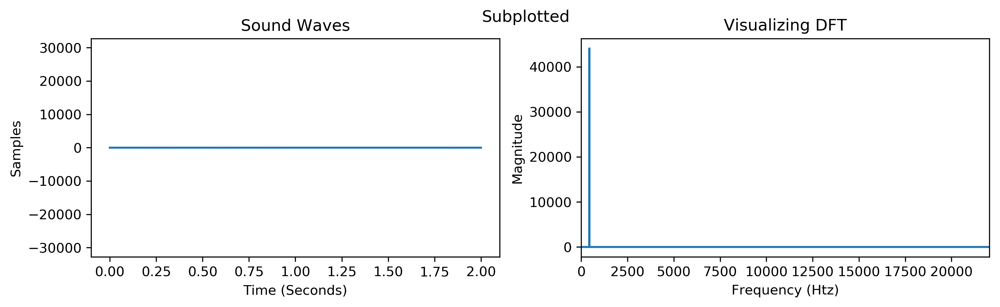

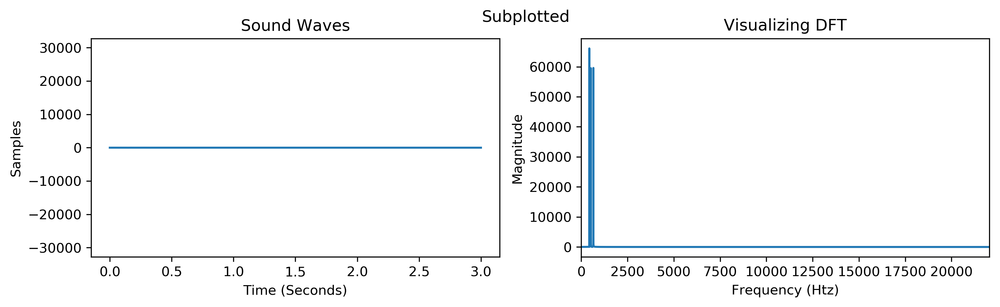

In [16]:
# Plot the sub plots(SOund waves and DFT)
sw_a.plot(True)
sw_cord.plot(True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

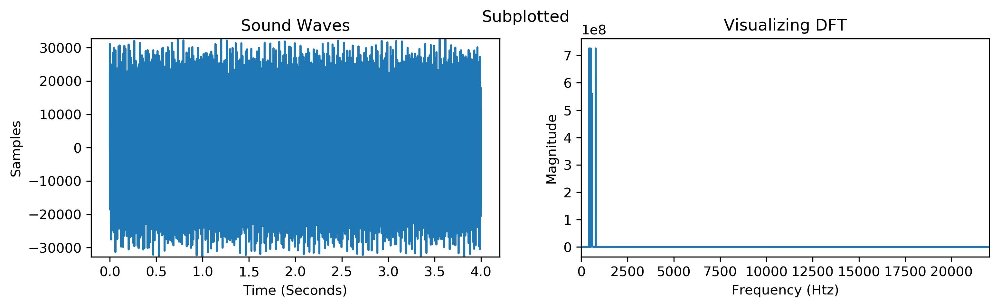

Frequencies are: [440.   784.   523.25 587.5  587.25 587.75 587.   588.   586.75 588.25]
Notes are: ['A', 'G', 'C', 'D']


In [17]:
rate, samples = wavfile.read("mystery_chord.wav")
sw_m = SoundWave(rate, samples)
sw_m.plot(True)
sw_m.export("m_c.wav")

# Calculate the ten largest samples
large_10 = np.argsort(np.abs(sw_m.dft[:sw_m.n//2]))[::-1][:10]

# Turn them into frequencies
freq = (large_10 * sw_m.rate)/sw_m.n

print("Frequencies are:", freq)

# By inspection we can determine the notes:
print('Notes are:', ['A', 'G', 'C', 'D'])
IPython.display.Audio('m_c.wav')

The notes are...

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [18]:
# Open file
rate, samples = wavfile.read('tada.wav')

# Create sound wave file and plot
swt = SoundWave(rate, samples)
swr = SoundWave(rate, np.random.randint(-32767, 32767, rate*2, dtype=np.int16))
# swr.export("test5.wav")
# IPython.display.Audio('test5.wav')
swn = swt * swr
swn.export("test6.wav")
IPython.display.Audio('test6.wav')


### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [29]:
# Open file
rate, samples = wavfile.read('CGC.wav')
# Create sound wave file and plot
sw1 = SoundWave(rate, samples)
# sw1.plot(True)
print(len(samples))

rate, samples = wavfile.read('GCG.wav')
sw2 = SoundWave(rate, samples)
print(len(samples))
print("before")
# Linear Colvolve
sw3 = sw1 ** sw2
print("after")
sw1.export("test7.wav")
IPython.display.Audio('test7.wav')

132300
132300
before
after


In [21]:
# Linear Convolve Sound
sw3.export("test8.wav")
IPython.display.Audio('test8.wav')

In [20]:
# Standard linear convolve sound
samples = signal.fftconvolve(sw1.samples, sw2.samples)
print("dffd")
sw4 = SoundWave(rate, samples)
print()
sw4.export("test8.wav")
IPython.display.Audio('test8.wav')

dffd



### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [22]:
rate, samples = wavfile.read('chopin.wav')
# Create sound wave file and plot
chopin = SoundWave(rate, samples)

rate, samples = wavfile.read('balloon.wav')
# Create sound wave file and plot
balloon = SoundWave(rate, samples)
samples = signal.fftconvolve(chopin.samples, balloon.samples)

In [23]:
IPython.display.Audio('chopin.wav')

In [24]:
IPython.display.Audio('balloon.wav')

In [25]:
IPython.display.Audio(rate=rate, data=samples)

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [43]:
IPython.display.Audio('noisy1.wav')

In [ ]:
IPython.display.Audio('noisy2.wav')

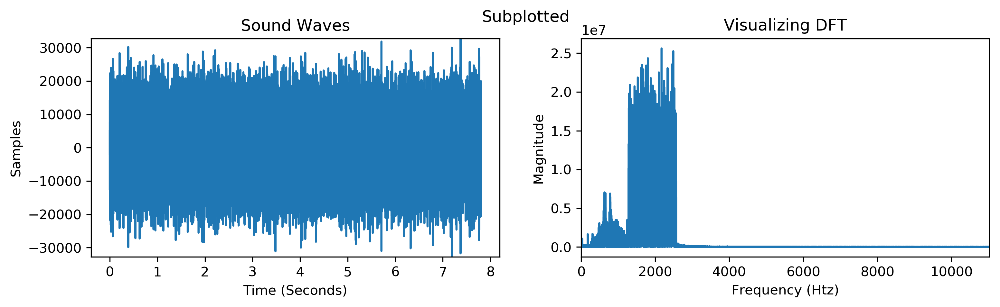

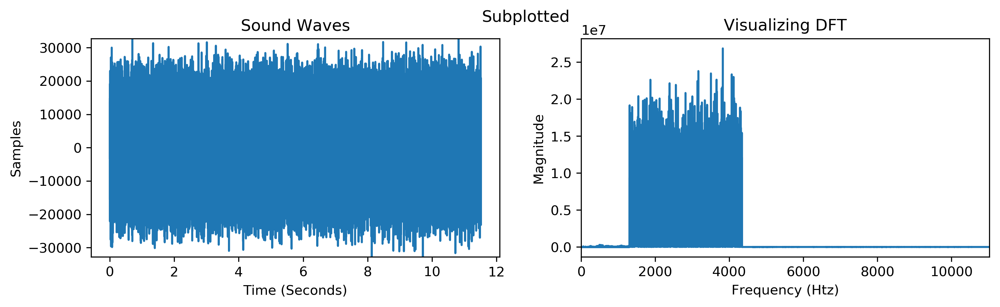

In [55]:
rate, samples = wavfile.read('noisy1.wav')
# Create sound wave file and plot
noisy1 = SoundWave(rate, samples)
noisy1.plot(True)


rate, samples = wavfile.read('noisy2.wav')
# Create sound wave file and plot
noisy2 = SoundWave(rate, samples)
noisy2.plot(True)

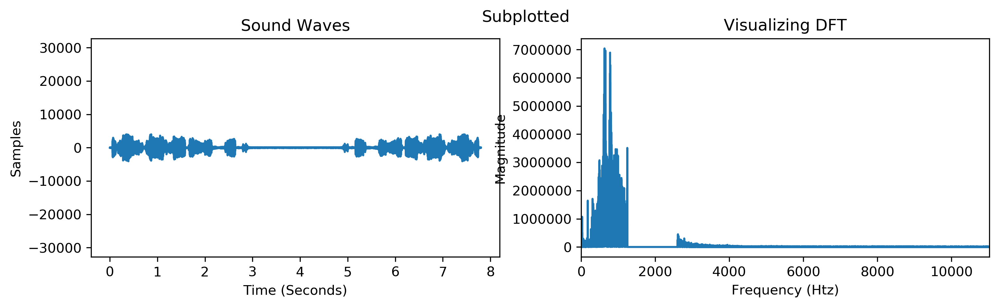

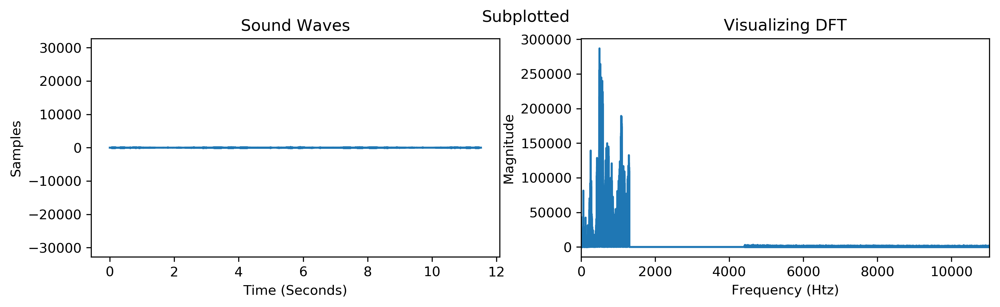

In [59]:
noisy1.clean(1250, 2600)
noisy1.export("noisy1t.wav")
noisy1.plot(True)
noisy2.clean(1300, 4400)
noisy2.plot(True)
noisy2.export("noisy2t.wav")

In [60]:
IPython.display.Audio('noisy1t.wav')

In [58]:
IPython.display.Audio('noisy2t.wav')

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

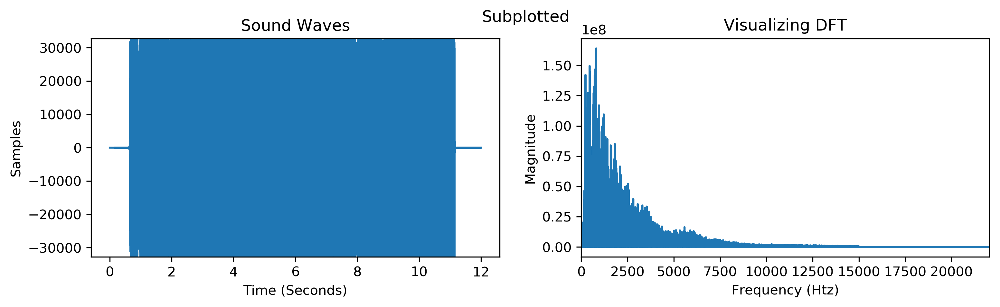

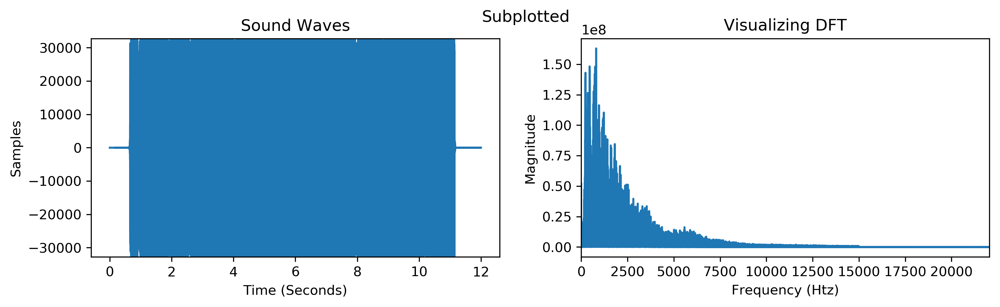

In [86]:
rate, samples = wavfile.read('vuvuzela.wav')
vuvuzela1 = SoundWave(rate, samples[:,0])
vuvuzela1.plot(True)

vuvuzela2 = SoundWave(rate, samples[:,1])
vuvuzela2.plot(True)

In [88]:
IPython.display.Audio('vuvuzela.wav')

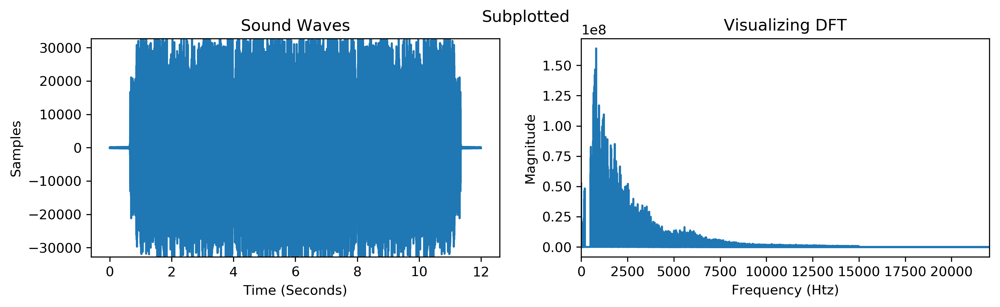

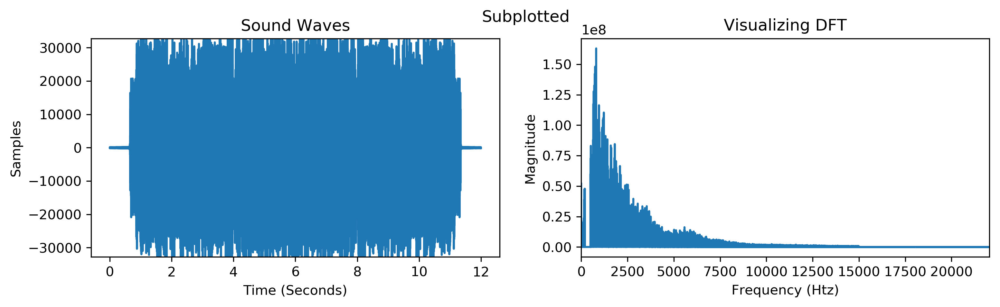

In [87]:
vuvuzela1.clean(200,500)
vuvuzela2.clean(200,500)
vuvuzela1.plot(True)
vuvuzela2.plot(True)

In [84]:
IPython.display.Audio(rate=rate, data=vuvuzela1.samples + vuvuzela2.samples)

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

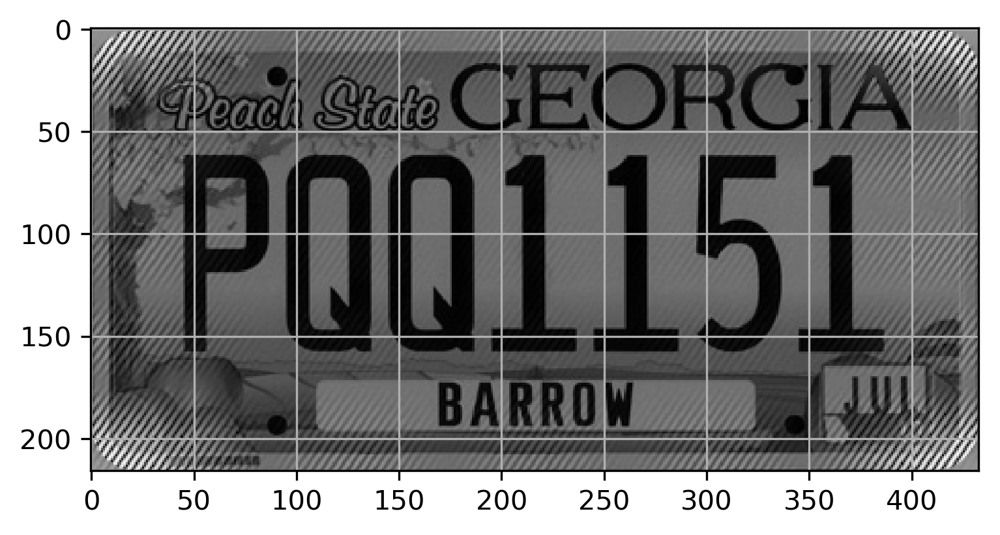

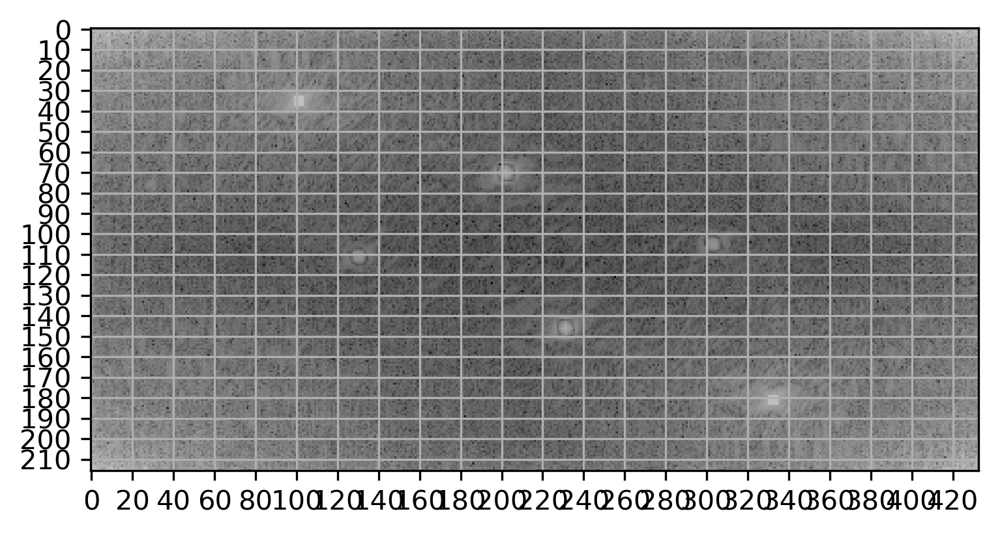

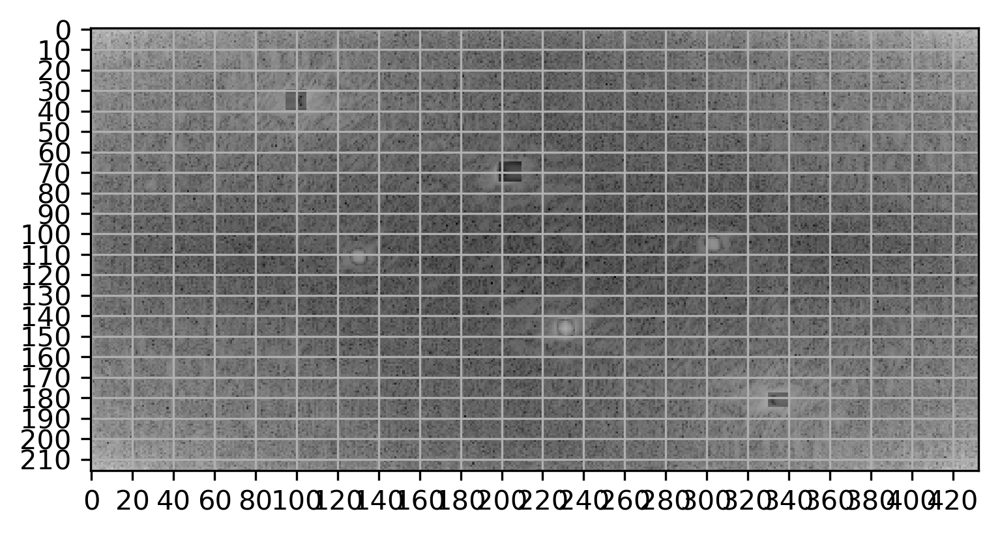

In [155]:
import imageio
from scipy.fftpack import fft2, ifft2

im = imageio.imread("license_plate.png")
im_dft = fft2(im)

# Show oringinal image
plt.imshow(im, cmap="gray")
plt.grid()
plt.show()

# Show the dft image
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.yticks(np.arange(0, 216, step=10))
plt.xticks(np.arange(0, 433, step=20))
plt.grid()
plt.show()

# Take out the bright spots
for i in range(30,40):
    for j in range(95,105):
        im_dft[i,j] = sum(im_dft[i,:]) / len(im_dft[i,:])
for i in range(65,75):
    for j in range(199,210):
        im_dft[i,j] = sum(im_dft[i,:]) / len(im_dft[i,:])  
for i in range(178,185):
    for j in range(330,340):
        im_dft[i,j] = sum(im_dft[i,:]) / len(im_dft[i,:])

# Fixed 
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.yticks(np.arange(0, 216, step=10))
plt.xticks(np.arange(0, 433, step=20))
plt.grid()
plt.show()

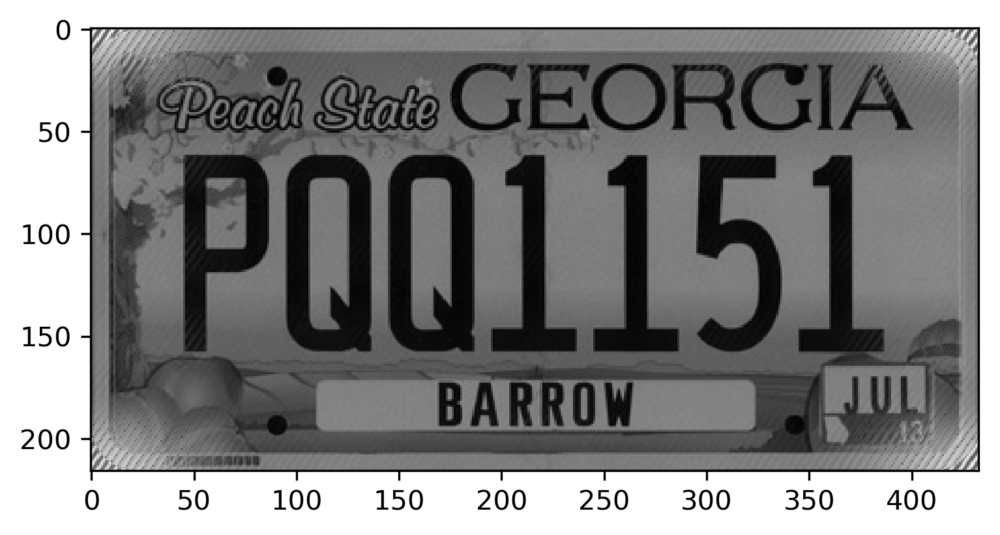

In [156]:
im_dft_ifft = ifft2(im_dft).real
plt.imshow(im_dft_ifft, cmap="gray")
plt.show()

The year on the sticker is 2013!!!